# CAPSTONE PROJECT

### CAR ACCIDENT SEVERITY

In [1]:
import pandas as pd
import numpy as np

## Introduction

Let's imagine, that my family and I have made plans of going out in the evening and everyone is almost ready. But suddenly I see flash of lightening outside, hear the roaring thunder and the pitter-patter of rain drops. Everyone gets dissappointed as the elders start advising that it is not safe to drive in such conditions. We cancel the plan. 
However, we cannot do the same if it is an urgent meeting you have to attend or catch a flight for an important business oppurtunity overseas. Because the elders are just making vague predictions based on their experience. It is coorect to a certain extent but these appointments cannot be missed based on predictions made with no certain proof.

Thus, this project focuses on bulding a Machine Learning Model to predict the safety of the travellers (i.e) the probability of an accident to occur based on various factors including weather, road conditions, traffic, etc. It helps make more accurate predictions based on the data collected from different accident locations in Seattle.

The information gathered by performing Data Analysis on the collected data will help the police forces and emergency medical evcuation team to warned and be prepared for being able to reach the location that are accident-prone areas.
If found that the state of the roads are being a major cause for accidents, then the public works department can be notified about the amendments to be made for safe travel.

## About the Dataset

The details of various accidents and the severity of the accident occuring at muliple location across Seattle are collected and recorded to analyse and find the cause of accident so as to warn the concerned to take appropriate measures to reduce the accident rates.

The severity of the accident is categorized into five groups. The aim of the model is to find the dependency of severity of the accident on the factors like age of the driver, location of accident, whether the driver was under influence or not.

I have the accident data downloaded as **Data-Collisions.csv**, which includes all types of collisions. Collisions will display at the intersection or
mid-block of a segment. Timeframe: 2004 to Present. Data obtained from *SDOT Traffic Management Division, Traffic Records Group.

* OBJECTID - ESRI unique identifier
* SHAPE - ESRI geometry field
* INCKEY - A unique key for the incident
* COLDETKEY - Secondary key for the incident
* ADDRTYPE - Collision address type: Alley, Block, Intersection
* INTKEY - Key that corresponds to the intersection associated with a collision 
* LOCATION - Description of the general location of the collision
* SEVERITYCODE - A code that corresponds to the severity of the collision:
3—fatality,
2b—serious injury,
2—injury,
1—property damage,
0—unknown,

* SEVERITYDESC - A detailed description of the severity of the collision
* COLLISIONTYPE - Collision type
* PERSONCOUNT - The total number of people involved in the collision
* PEDCOUNT - The number of pedestrians involved in the collision. 
* PEDCYLCOUNT - The number of bicycles involved in the collision. 
* VEHCOUNT - The number of vehicles involved in the collision. 
* INJURIES - The number of total injuries in the collision. 
* SERIOUSINJURIES - The number of serious injuries in the collision.
* FATALITIES - The number of fatalities in the collision.
* INCDATE - The date of the incident.
* INCDTTM - The date and time of the incident.
* JUNCTIONTYPE - Category of junction at which collision took place
* INATTENTIONIND - Whether or not collision was due to inattention. (Y/N)
* UNDERINFL - Whether or not a driver involved was under the influence of drugs or alcohol. 
* WEATHER - A description of the weather conditions during the time of the collision.
* ROADCOND - The condition of the road during the collision.
* LIGHTCOND - The light conditions during the collision.
* PEDROWNOTGRNT - Whether or not the pedestrian right of way was not granted. (Y/N)
* SDOTCOLNUM - A number given to the collision by SDOT.
* SPEEDING - Whether or not speeding was a factor in the collision. (Y/N)
* ST_COLCODE - A code provided by the state that describes the collision. For more information about these codes, please see the State Collision Code Dictionary.
* ST_COLDESC - A description that corresponds to the state’s coding designation.
* SEGLANEKEY - A key for the lane segment in which the collision occurred.
* CROSSWALKKEY - A key for the crosswalk at which the collision occurred.
* HITPARKEDCAR - Whether or not the collision involved hitting a parked car. (Y/N) 

#### State Collision Code Dictionary 

* 0 - Vehicle Going Straight Hits Pedestrian
* 1 - Vehicle Turning Right Hits Pedestrian
* 2 - Vehicle Turning Left Hits Pedestrian
* 3 - Vehicle Backing Hits Pedestrian
* 4 - Vehicle Hits Pedestrian - All Other Actions
* 5 - Vehicle Hits Pedestrian - Actions Not Stated
* 10 - Entering At Angle
* 11 - From Same Direction -Both Going Straight-Both Moving- Sideswipe
* 12 - From Same Direction -Both Going Straight-One Stopped- Sideswipe
* 13 - From Same Direction - Both Going Straight - Both Moving - Rear End 

# CODE

## IMPORTING DATA

In [2]:
df = pd.read_csv("https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv")
df.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [3]:
print(df.dtypes)
df.shape

SEVERITYCODE        int64
X                 float64
Y                 float64
OBJECTID            int64
INCKEY              int64
COLDETKEY           int64
REPORTNO           object
STATUS             object
ADDRTYPE           object
INTKEY            float64
LOCATION           object
EXCEPTRSNCODE      object
EXCEPTRSNDESC      object
SEVERITYCODE.1      int64
SEVERITYDESC       object
COLLISIONTYPE      object
PERSONCOUNT         int64
PEDCOUNT            int64
PEDCYLCOUNT         int64
VEHCOUNT            int64
INCDATE            object
INCDTTM            object
JUNCTIONTYPE       object
SDOT_COLCODE        int64
SDOT_COLDESC       object
INATTENTIONIND     object
UNDERINFL          object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
PEDROWNOTGRNT      object
SDOTCOLNUM        float64
SPEEDING           object
ST_COLCODE         object
ST_COLDESC         object
SEGLANEKEY          int64
CROSSWALKKEY        int64
HITPARKEDCAR       object
dtype: objec

(194673, 38)

## DATA CLEANING

In [4]:
df.drop(columns=['OBJECTID','SEVERITYDESC','INCKEY','COLLISIONTYPE','JUNCTIONTYPE','REPORTNO',
                 'COLDETKEY', 'INTKEY','STATUS','EXCEPTRSNCODE','EXCEPTRSNDESC','CROSSWALKKEY','ST_COLCODE',
                 'SEGLANEKEY','SDOTCOLNUM','ST_COLDESC','SDOT_COLCODE','SDOT_COLDESC','SEVERITYCODE.1'], inplace=True)

In [5]:
df = df.dropna(subset=["SEVERITYCODE","ADDRTYPE","UNDERINFL","ROADCOND","LIGHTCOND","WEATHER","LOCATION","X","Y"],axis=0)

In [6]:
df.describe(include = "all")

,SEVERITYCODE,X,Y,ADDRTYPE,LOCATION,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDATE,INCDTTM,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,HITPARKEDCAR
count,184167.000000,184167.000000,184167.000000,184167,184167,184167.000000,184167.000000,184167.000000,184167.000000,184167,184167,29099,184167,184167,184167,184167,4643,8707,184167
unique,NaN,NaN,NaN,2,23722,NaN,NaN,NaN,NaN,5947,155840,1,4,11,9,9,1,1,2
top,NaN,NaN,NaN,Block,N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND COR...,NaN,NaN,NaN,NaN,2006/11/02 00:00:00+00,11/2/2006,Y,N,Clear,Dry,Daylight,Y,Y,N
freq,NaN,NaN,NaN,121023,260,NaN,NaN,NaN,NaN,88,88,29099,97244,108833,121871,113522,4643,8707,177537
mean,1.304142,-122.330502,47.619544,NaN,NaN,2.468048,0.038845,0.029745,1.973692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,0.460045,0.030018,0.056215,NaN,NaN,1.358602,0.202556,0.171220,0.556182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,-122.419091,47.495573,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,1.000000,-122.348846,47.575884,NaN,NaN,2.000000,0.000000,0.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,1.000000,-122.330168,47.615361,NaN,NaN,2.000000,0.000000,0.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,2.000000,-122.311922,47.663835,NaN,NaN,3.000000,0.000000,0.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.corr()

,SEVERITYCODE,X,Y,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT
SEVERITYCODE,1.000000,0.010230,0.018436,0.127388,0.248415,0.216448,-0.085234
X,0.010230,1.000000,-0.160175,0.012762,0.011408,-0.001923,-0.016030
Y,0.018436,-0.160175,1.000000,-0.014068,0.010422,0.026657,0.020603
PERSONCOUNT,0.127388,0.012762,-0.014068,1.000000,-0.026981,-0.042459,0.395165
PEDCOUNT,0.248415,0.011408,0.010422,-0.026981,1.000000,-0.018442,-0.321520
PEDCYLCOUNT,0.216448,-0.001923,0.026657,-0.042459,-0.018442,1.000000,-0.311260
VEHCOUNT,-0.085234,-0.016030,0.020603,0.395165,-0.321520,-0.311260,1.000000


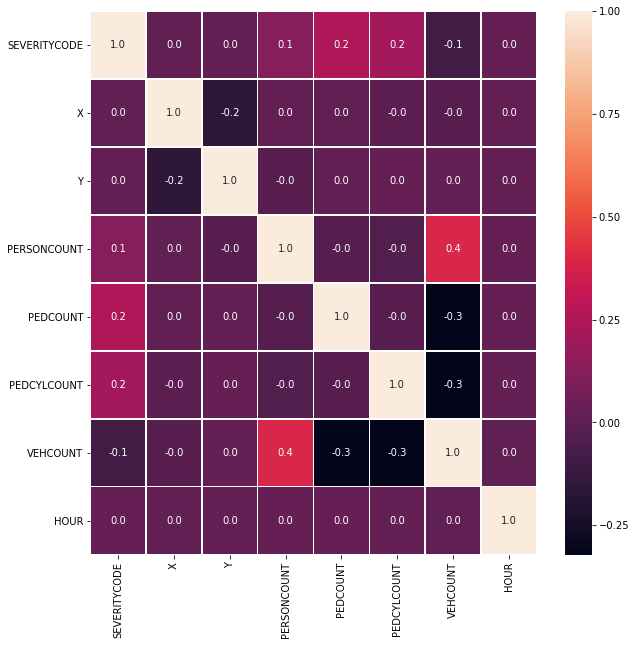

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
f, ax = plt.subplots (figsize=(10,10))
sns.heatmap(df.corr(),annot=True,linewidth=0.5,fmt=".1f", ax=ax)
plt.show()

In [10]:
#changing date format
df['INCDATE'] = pd.to_datetime(df['INCDATE'])
df['DAY'] = df['INCDATE'].dt.day_name()
df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])
df['HOUR'] = df['INCDTTM'].dt.hour

In [12]:
df["SEVERITYCODE"].value_counts()

1    128154
2     56013
Name: SEVERITYCODE, dtype: int64

It is observed that no fatalities or serious injuries are caused due to the accidents. The recorded cases are either of property damage or minor injuries to the people involved

In [13]:
print(df["ADDRTYPE"].value_counts())

Block           121023
Intersection     63144
Name: ADDRTYPE, dtype: int64


In [14]:
df["UNDERINFL"]=df["UNDERINFL"].replace(['N','NaN','Y','0','1'],[0,0,1,0,1])
df["UNDERINFL"]=df["UNDERINFL"].replace(np.nan,0)
df["UNDERINFL"].value_counts().astype(int)

0    175308
1      8859
Name: UNDERINFL, dtype: int64

Many times, we assume that most of the accidents occur because the driver is under the influence. But, here, we are proved wrong as the maximum number of accidents happen when the driver was not under the influence of alcohol or so.

In [15]:
df["INATTENTIONIND"] = df["INATTENTIONIND"].replace(['Nan','Y'],[0,1])
df["INATTENTIONIND"] = df["INATTENTIONIND"].replace(np.nan,0)
#print(df["INATTENTIONIND"].isnull().sum())
df["INATTENTIONIND"].value_counts().astype(int)

0.0    155068
1.0     29099
Name: INATTENTIONIND, dtype: int64

In [16]:
print(df["ROADCOND"].value_counts())

Dry               121871
Wet                46009
Unknown            13795
Ice                 1174
Snow/Slush           984
Other                116
Standing Water       102
Sand/Mud/Dirt         63
Oil                   53
Name: ROADCOND, dtype: int64


In [17]:
print(df["LIGHTCOND"].value_counts())

Daylight                    113522
Dark - Street Lights On      47250
Unknown                      12416
Dusk                          5763
Dawn                          2422
Dark - No Street Lights       1450
Dark - Street Lights Off      1145
Other                          188
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64


In [18]:
df["SPEEDING"] = df["SPEEDING"].replace(['Nan','Y'],[0,1])
df["SPEEDING"] = df["SPEEDING"].replace(np.nan,0)
df["SPEEDING"].value_counts().astype(int)

0.0    175460
1.0      8707
Name: SPEEDING, dtype: int64

Speeding was not the reason for maximum number of accidents

In [19]:
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace(np.nan, 0)
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace('Y', 1)
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace('N', 0)

In [20]:
df.drop(df.loc[df['ROADCOND']=='Unknown'].index, inplace=True)
df.drop(df.loc[df['WEATHER']=='Unknown'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Unknown'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Other'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Standing Water'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Sand/Mud/Dirt'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Oil'].index, inplace=True)
df.drop(df.loc[df['WEATHER']=='Fog/Smog/Smoke'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Other'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Sleet/Hail/Freezing Rain'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Blowing Sand/Dirt'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Severe Crosswind'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Partly Cloudy'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Other'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Dark - Unknown Lighting'].index, inplace=True)

In [21]:
#checking the counts again for all three attributes to see changes
df['ROADCOND'].value_counts()

Dry           118776
Wet            44738
Ice              998
Snow/Slush       789
Name: ROADCOND, dtype: int64

In [22]:
df["LIGHTCOND"].value_counts()

Daylight                    109926
Dark - Street Lights On      45205
Dusk                          5516
Dawn                          2289
Dark - No Street Lights       1314
Dark - Street Lights Off      1051
Name: LIGHTCOND, dtype: int64

In [23]:
df['WEATHER'].value_counts()

Clear       106701
Raining      31441
Overcast     26348
Snowing        811
Name: WEATHER, dtype: int64

In [24]:
print(df.shape)
df.head()

(165301, 21)


,SEVERITYCODE,X,Y,ADDRTYPE,LOCATION,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDATE,...,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,HITPARKEDCAR,DAY,HOUR
0,2,-122.323148,47.703140,Intersection,5TH AVE NE AND NE 103RD ST,2,0,0,2,2013-03-27 00:00:00+00:00,...,0.0,0,Overcast,Wet,Daylight,0,0.0,N,Wednesday,14
1,1,-122.347294,47.647172,Block,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,2,0,0,2,2006-12-20 00:00:00+00:00,...,0.0,0,Raining,Wet,Dark - Street Lights On,0,0.0,N,Wednesday,18
2,1,-122.334540,47.607871,Block,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,4,0,0,3,2004-11-18 00:00:00+00:00,...,0.0,0,Overcast,Dry,Daylight,0,0.0,N,Thursday,10
3,1,-122.334803,47.604803,Block,2ND AVE BETWEEN MARION ST AND MADISON ST,3,0,0,3,2013-03-29 00:00:00+00:00,...,0.0,0,Clear,Dry,Daylight,0,0.0,N,Friday,9
4,2,-122.306426,47.545739,Intersection,SWIFT AVE S AND SWIFT AV OFF RP,2,0,0,2,2004-01-28 00:00:00+00:00,...,0.0,0,Raining,Wet,Daylight,0,0.0,N,Wednesday,8


In most of the accidents, there are only property damages and fatalities because the moving cars has collided with parked cars.

In [25]:
df_new=df[['SEVERITYCODE', 'ADDRTYPE','INATTENTIONIND', 'UNDERINFL', 'SPEEDING', 'ROADCOND', 'WEATHER', 'LIGHTCOND','DAY','HOUR','LOCATION','X','Y']]
df_new.head()

,SEVERITYCODE,ADDRTYPE,INATTENTIONIND,UNDERINFL,SPEEDING,ROADCOND,WEATHER,LIGHTCOND,DAY,HOUR,LOCATION,X,Y
0,2,Intersection,0.0,0,0.0,Wet,Overcast,Daylight,Wednesday,14,5TH AVE NE AND NE 103RD ST,-122.323148,47.703140
1,1,Block,0.0,0,0.0,Wet,Raining,Dark - Street Lights On,Wednesday,18,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,-122.347294,47.647172
2,1,Block,0.0,0,0.0,Dry,Overcast,Daylight,Thursday,10,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,-122.334540,47.607871
3,1,Block,0.0,0,0.0,Dry,Clear,Daylight,Friday,9,2ND AVE BETWEEN MARION ST AND MADISON ST,-122.334803,47.604803
4,2,Intersection,0.0,0,0.0,Wet,Raining,Daylight,Wednesday,8,SWIFT AVE S AND SWIFT AV OFF RP,-122.306426,47.545739


In [26]:
df_temp=df_new[['SEVERITYCODE', 'ROADCOND', 'WEATHER', 'LIGHTCOND']]
df_t=(df_temp.set_index('SEVERITYCODE').stack()
 .groupby(level=[0,1])
 .value_counts()
 .unstack(level=[1,2])
 .fillna(0)
 .sort_index(axis=1))
df_t.head()

LIGHTCOND                           \
             Dark - No Street Lights Dark - Street Lights Off   
SEVERITYCODE                                                    
1                               1015                      756   
2                                299                      295   

                                                          ROADCOND       \
             Dark - Street Lights On  Dawn Daylight  Dusk      Dry  Ice   
SEVERITYCODE                                                              
1                              31350  1513    72602  3648    79843  759   
2                              13855   776    37324  1868    38933  239   

                               WEATHER                           
             Snow/Slush    Wet   Clear Overcast Raining Snowing  
SEVERITYCODE                                                     
1                   643  29639   71678    17866   20690     650  
2                   146  15099   35023     8482   10751     161

## EXPLORATORY DATA ANALYSIS

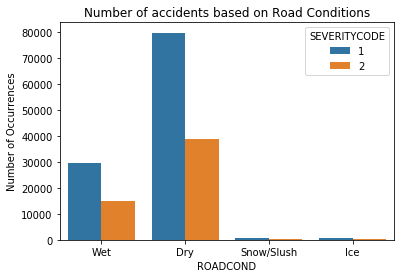

In [27]:
#plot based on Road conditions
chart=sns.countplot(x='ROADCOND', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Road Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.show()

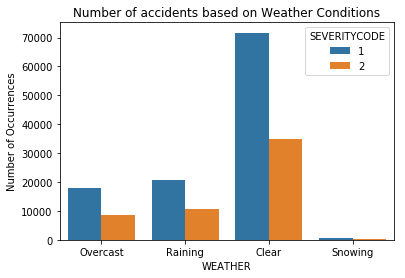

In [28]:
#plot based on Weather conditions
chart=sns.countplot(x='WEATHER', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Weather Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.show()

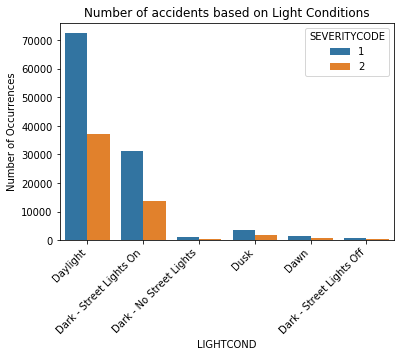

In [29]:
#plot based on Light conditions
chart=sns.countplot(x='LIGHTCOND', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Light Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)

#aligning the labels
chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=45, 
    horizontalalignment='right')
plt.show()

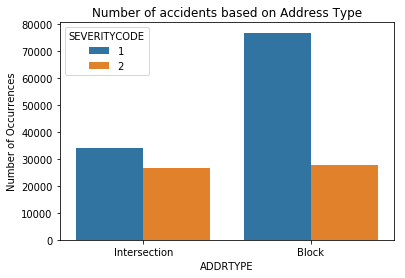

In [30]:
#plot based on Address type
chart=sns.countplot(x='ADDRTYPE', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Address Type")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.show()

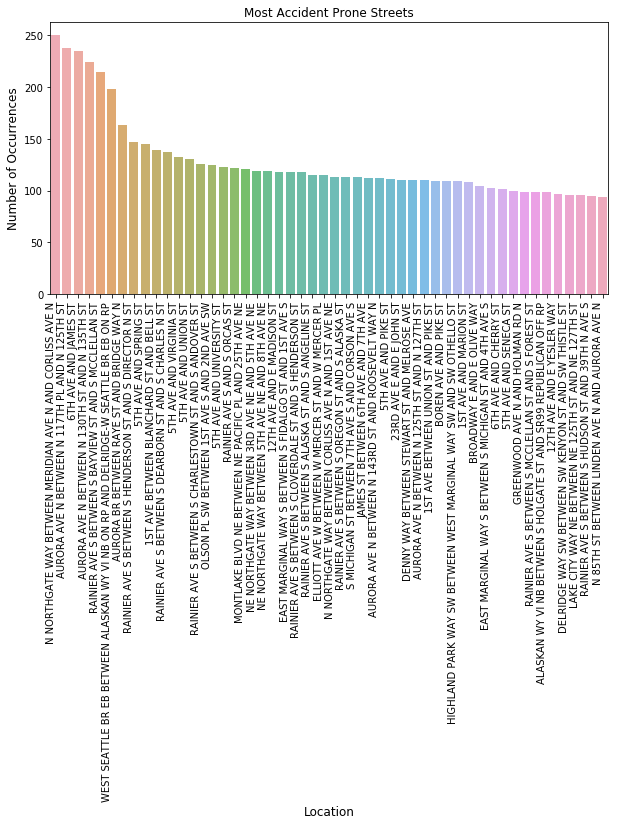

In [31]:
#plot based on Street
loc_count  = df["LOCATION"].value_counts()
loc_count = loc_count[:50,]
plt.figure(figsize=(10,5))
chart=sns.barplot(loc_count.index, loc_count.values, alpha=0.8)
plt.title("Most Accident Prone Streets")
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Location', fontsize=12)

#aligning the labels
chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=90, 
    horizontalalignment='right')
plt.show()

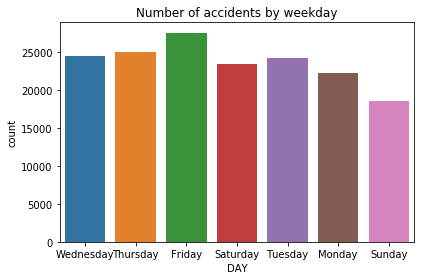

In [32]:
#plot of accidents against days of week
sns.countplot(x = "DAY" , data = df_new)
plt.title("Number of accidents by weekday")
plt.tight_layout()
plt.show()

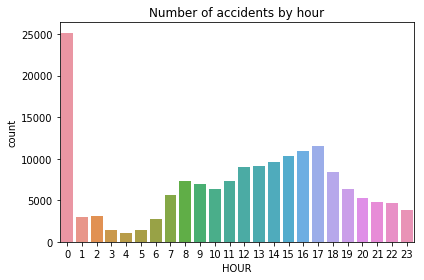

In [33]:
#plot of accidents against hours of the day
sns.countplot(x = "HOUR" , data = df_new)
plt.title("Number of accidents by hour")
plt.tight_layout()
plt.show()

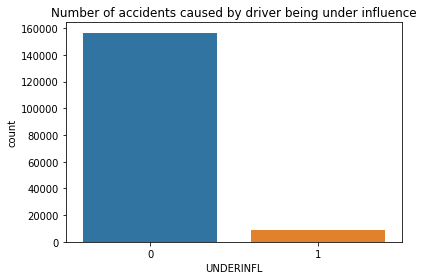

In [34]:
#plot of accidents caused by driver being under influence
sns.countplot(x = "UNDERINFL" , data = df_new)
plt.title("Number of accidents caused by driver being under influence")
plt.tight_layout()
plt.show()

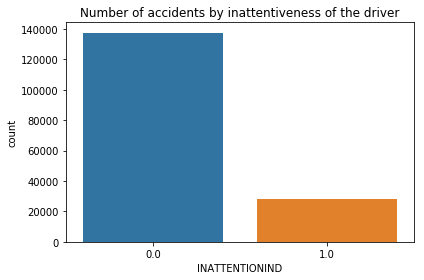

In [35]:
#plot of accident caused by inattentiveness of the driver
sns.countplot(x = 'INATTENTIONIND', data=df_new)
plt.title("Number of accidents by inattentiveness of the driver")
plt.tight_layout()
plt.show()

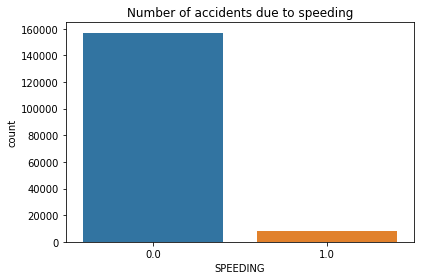

In [36]:
#plot of accidents due to speeding
sns.countplot(x = 'SPEEDING', data=df_new)
plt.title("Number of accidents due to speeding")
plt.tight_layout()
plt.show()

### Label Encoding categorical data for machine learning algorithms

In [37]:
df_new["LOCATION_VAL"] = df_new["LOCATION"].astype('category')
df_new["LOCATION_VAL"] = df_new["LOCATION_VAL"].cat.codes
df_new["ADDRTYPE_VAL"] = df_new["ADDRTYPE"].astype('category')
df_new["ADDRTYPE_VAL"] = df_new["ADDRTYPE_VAL"].cat.codes
df_new["ROAD_VAL"] = df_new["ROADCOND"].astype('category')
df_new["ROAD_VAL"] = df_new["ROAD_VAL"].cat.codes
df_new["WEATHER_VAL"] = df_new["WEATHER"].astype('category')
df_new["WEATHER_VAL"] = df_new["WEATHER_VAL"].cat.codes
df_new["LIGHT_VAL"] = df_new["LIGHTCOND"].astype('category')
df_new["LIGHT_VAL"] = df_new["LIGHT_VAL"].cat.codes
day_nums = {"DAY": {"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6}}
df_new.replace(day_nums, inplace=True)
df_new.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

,SEVERITYCODE,ADDRTYPE,INATTENTIONIND,UNDERINFL,SPEEDING,ROADCOND,WEATHER,LIGHTCOND,DAY,HOUR,LOCATION,X,Y,LOCATION_VAL,ADDRTYPE_VAL,ROAD_VAL,WEATHER_VAL,LIGHT_VAL
0,2,Intersection,0.0,0,0.0,Wet,Overcast,Daylight,2,14,5TH AVE NE AND NE 103RD ST,-122.323148,47.703140,8089,1,3,1,4
1,1,Block,0.0,0,0.0,Wet,Raining,Dark - Street Lights On,2,18,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,-122.347294,47.647172,9867,0,3,2,2
2,1,Block,0.0,0,0.0,Dry,Overcast,Daylight,3,10,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,-122.334540,47.607871,7404,0,0,1,4
3,1,Block,0.0,0,0.0,Dry,Clear,Daylight,4,9,2ND AVE BETWEEN MARION ST AND MADISON ST,-122.334803,47.604803,4331,0,0,0,4
4,2,Intersection,0.0,0,0.0,Wet,Raining,Daylight,2,8,SWIFT AVE S AND SWIFT AV OFF RP,-122.306426,47.545739,20996,1,3,2,4


In [38]:
df_model = df_new[['SEVERITYCODE', 'ADDRTYPE_VAL', 'UNDERINFL', 'INATTENTIONIND', 'SPEEDING', 'ROAD_VAL','WEATHER_VAL','LIGHT_VAL','DAY','HOUR','X','Y']].copy()

### CONVERTING DATA TO ARRAYS

In [39]:
X = df_new[["ADDRTYPE_VAL","UNDERINFL","INATTENTIONIND","ROAD_VAL","LIGHT_VAL","SPEEDING","WEATHER_VAL","DAY","HOUR","X","Y"]].values
X[0:5]

array([[   1.        ,    0.        ,    0.        ,    3.        ,
           4.        ,    0.        ,    1.        ,    2.        ,
          14.        , -122.3231484 ,   47.70314032],
       [   0.        ,    0.        ,    0.        ,    3.        ,
           2.        ,    0.        ,    2.        ,    2.        ,
          18.        , -122.3472943 ,   47.64717249],
       [   0.        ,    0.        ,    0.        ,    0.        ,
           4.        ,    0.        ,    1.        ,    3.        ,
          10.        , -122.33454   ,   47.60787143],
       [   0.        ,    0.        ,    0.        ,    0.        ,
           4.        ,    0.        ,    0.        ,    4.        ,
           9.        , -122.3348033 ,   47.60480289],
       [   1.        ,    0.        ,    0.        ,    3.        ,
           4.        ,    0.        ,    2.        ,    2.        ,
           8.        , -122.3064263 ,   47.54573946]])

In [40]:
Y = df_new["SEVERITYCODE"].values
Y[0:5]

array([2, 1, 1, 1, 2])

### NORMALIZE DATA

In [41]:
from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X.astype(float))
X[0:5]

array([[ 1.31287825, -0.23550126, -0.45048055,  1.63010573,  0.58088434,
        -0.23109017,  0.54964917, -0.49009933,  0.36169403,  0.24108177,
         1.48624205],
       [-0.76168525, -0.23550126, -0.45048055,  1.63010573, -1.42808635,
        -0.23109017,  1.78348983, -0.49009933,  0.94302732, -0.56905453,
         0.49799413],
       [-0.76168525, -0.23550126, -0.45048055, -0.62092478,  0.58088434,
        -0.23109017,  0.54964917,  0.03128609, -0.21963926, -0.14112592,
        -0.19596151],
       [-0.76168525, -0.23550126, -0.45048055, -0.62092478,  0.58088434,
        -0.23109017, -0.68419148,  0.55267151, -0.36497258, -0.14996009,
        -0.25014403],
       [ 1.31287825, -0.23550126, -0.45048055,  1.63010573,  0.58088434,
        -0.23109017,  1.78348983, -0.49009933, -0.51030591,  0.80213687,
        -1.2930523 ]])

### SPLIT THE DATA INTO TRAINING AND TESTING DATASETS

In [42]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=0.3, random_state=3)

## CLASSIFICATION 

### K NEAREST NEIGHBOR METHOD

In [43]:
#KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfusionMx=[];
for n in range (1,Ks):
    neigh = KNeighborsClassifier(n_neighbors=n).fit(x_train, y_train)
    yhat_knn = neigh.predict(x_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test,yhat_knn)
    std_acc[n-1] = np.std(yhat_knn==y_test)/np.sqrt(yhat_knn.shape[0])
mean_acc
print("Max Accuracy of ", mean_acc.max()," is achieved with k =", mean_acc.argmax()+1)

Max Accuracy of  0.6506019237361618  is achieved with k = 8


In [44]:
#Evaluation for knn
from sklearn.metrics import jaccard_similarity_score
jacc_knn=jaccard_similarity_score(y_test, yhat_knn)
from sklearn.metrics import f1_score
f1_knn=f1_score(y_test, yhat_knn, average='weighted')

### DECISION TREE METHOD

In [45]:
#DecisionTree
from sklearn.tree import DecisionTreeClassifier
accitree = DecisionTreeClassifier(criterion="entropy",max_depth=4)
accitree.fit(x_train,y_train)
yhat_tree = accitree.predict(x_test)
yhat_tree[0:5]

array([1, 1, 1, 1, 1])

In [65]:
print("Accuracy:", metrics.accuracy_score(y_test, yhat_tree))

from sklearn.metrics import jaccard_similarity_score
jacc_tree=jaccard_similarity_score(y_test, yhat_tree)
from sklearn.metrics import f1_score
f1_tree=f1_score(y_test, yhat_tree, average='weighted')

Accuracy: 0.671775120485572


In [47]:
!conda install -c anaconda seaborn -y
!conda install -c conda-forge pydotplus

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.7.22  |                0         132 KB  anaconda
    seaborn-0.10.1             |             py_0         160 KB  anaconda
    openssl-1.1.1g             |       h7b6447c_0         3.8 MB  anaconda
    certifi-2020.6.20          |           py36_0         160 KB  anaconda
    ------------------------------------------------------------
                                           Total:         4.2 MB

The following packages will be UPDATED:

    ca-certificates: 2020.7.22-0        --> 2020.7.22-0       anaconda
    certifi:         2020.6.20-py36_0   --> 2020.6.20-py36_0  anaconda
    openssl:         1.1.1g-h7b6447c_0  --> 1.1.1g-h7b6447c_0 anaconda
    seaborn:         0.9.0-pyh91

### LOGISTIC REGRESSION

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

LR = LogisticRegression(C = 0.01, solver = 'liblinear').fit(x_train, y_train)
yhat_lr = LR.predict(x_test)
yhat_lr[0:5]

array([1, 1, 1, 1, 1])

In [51]:
yhat_lr_prob = LR.predict_proba(x_test)

In [66]:
print("Accuracy:", metrics.accuracy_score(y_test, yhat_lr))

from sklearn.metrics import jaccard_similarity_score
jacc_lr=jaccard_similarity_score(y_test, yhat_lr)
from sklearn.metrics import f1_score
f1_lr=f1_score(y_test, yhat_lr, average='weighted')
from sklearn.metrics import log_loss
log_loss_lr=log_loss(y_test, yhat_lr_prob)

Accuracy: 0.669254501824928


In [60]:
#Confusion matrix
#from sklearn.metrics import classification_report
#import itertools
#def plt_confusion_matrix(cm, classes, normalize=False, title="Confusion matrix", cmap=plt.cm.Blues):
    #if normalize:
     #   cm = cm.astype('float')/cm.sum(axis=1)[:,np.newaxis]
      #  print("Normalized confusion matrix")
    #else:
     #   print("Confusion matrix without normalization")
    #print(cm)
    
    #plt.imshow(cm, interpolation='nearest',cmap=cmap)
    #plt.title(title)
    #plt.colorbar()
    #tick_marks = np.arange(len(classes))
    #plt.xticks(tick_marks, classes, rotation=False)
    #plt.yticks(tick_marks, classes)
    
    #fmt='.2f' if normalize else 'd'
    #thresh = cm.max()/2
    #for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
     #   plt.text(j,i, format(cm[i,j],fmt), horizontalalignment = "center", color="white" if cm[i,j] > thresh else 'black')
      #  plt.tight_layout()
       # plt.ylabel('True label')
        #plt.xlabel('Predicted label')

#print(confusion_matrix(y_test, yhat_lr, labels=[1,0]))

#cnf_matrix = confusion_matrix(y_test, yhat_lr, labels=[1,0])
#np.set_printoptions(precision=2)

#plt.figure()
#plt_confusion_matrix(cnf_matrix, classes=['SEVERITY=2','SEVERITY=1'], normalize=True, title='Cofusion matrix')

## EVALUATION

In [69]:
#accuracies for all 3 algorithms
data={'Algorithm':['KNN','Decision Tree','Logistic Regression'],
      'Jaccard':[jacc_knn,jacc_tree,jacc_lr],
      'F1-Score':[f1_knn,f1_tree,f1_lr],
      'LogLoss':['NA','NA',log_loss_lr]}
eval_df=pd.DataFrame(data, columns=['Algorithm','Jaccard','F1-Score','LogLoss'])
eval_df.head()

,Algorithm,Jaccard,F1-Score,LogLoss
0,KNN,0.669255,0.567111,NA
1,Decision Tree,0.671775,0.552822,NA
2,Logistic Regression,0.669255,0.567111,0.613368


## VISUALIZATION

In [68]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium
print('Folium installed and imported!')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         713 KB

The following NEW packages will be INSTALLED:

    altair:  4.1.0-py_1 conda-forge
    branca:  0.4.1-py_0 conda-forge
    folium:  0.5.0-py_0 conda-forge
    vincent: 0.4.4-py_1 conda-forge


altair-4.1.0         | 614 KB    | ##################################### | 1

In [73]:
df_loc=df[['SEVERITYCODE', 'X','Y']].copy()
df_loc.dropna(inplace=True)
df_loc.head()

,SEVERITYCODE,X,Y
0,2,-122.323148,47.703140
1,1,-122.347294,47.647172
2,1,-122.334540,47.607871
3,1,-122.334803,47.604803
4,2,-122.306426,47.545739


In [74]:
df_l=df_loc.loc[0:15000,:]

In [75]:
#plotting all the accidents on the map using Folium and Features for circle markers
seattle_latitude = 47.608013
seattle_longitude = -122.335167
seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=10)
#colour coding the categories for severity
def color(cat): 
    if cat=='1': 
        col = 'yellow'
    else: 
        col='red'
    return col 
# loop through the 100 crimes and add each to the map
for lat, lng, label, cat in zip(df_l.Y, df_l.X, df_l.SEVERITYCODE.astype(str), df_l.SEVERITYCODE.astype(str)):
    folium.features.CircleMarker(
        location=[lat, lng], 
        popup=label, radius=5, # define how big you want the circle markers to be
        color= color(cat),
        fill=True,
        fill_color='white',
        fill_opacity=0.5).add_to(seattle_map)

# show map
seattle_map